In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI1 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI1")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI1.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI1 (Bunderan HI),0.719512,0.314286,0.458333,0.092308,0.012821,0.300518,PM10,Sedang
1,2017-01-02,DKI1 (Bunderan HI),0.146341,0.295238,0.270833,0.082051,0.000000,0.139896,SO2,Baik
2,2017-01-03,DKI1 (Bunderan HI),0.170732,0.295238,0.291667,0.087179,0.012821,0.139896,SO2,Baik
3,2017-01-04,DKI1 (Bunderan HI),0.243902,0.295238,0.395833,0.087179,0.012821,0.139896,SO2,Baik
4,2017-01-05,DKI1 (Bunderan HI),0.304878,0.295238,0.458333,0.056410,0.012821,0.139896,SO2,Baik


Train Test Data

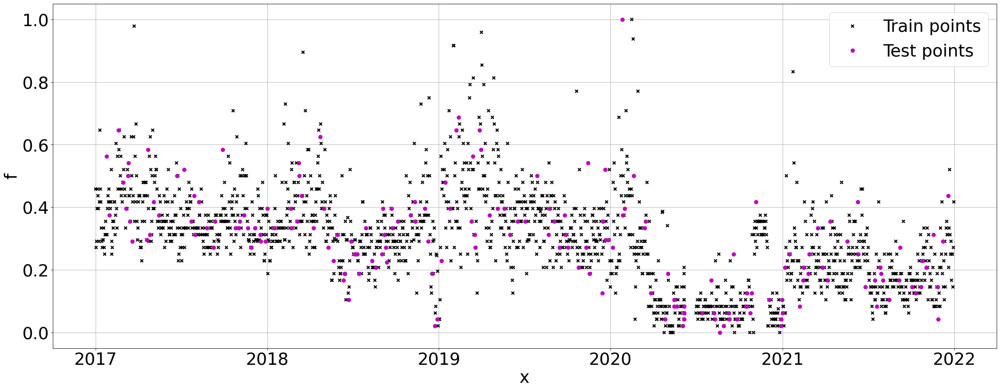

In [4]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI1.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI1['CO']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [143]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [144]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [5]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [146]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08348973232572589
MSE: 0.013598293079976806
RMSE: 0.1166117193080387
MAPE: 3953237296058.982
R2 Square 0.4366603050716922
__________________________________


In [147]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.4127218103915864

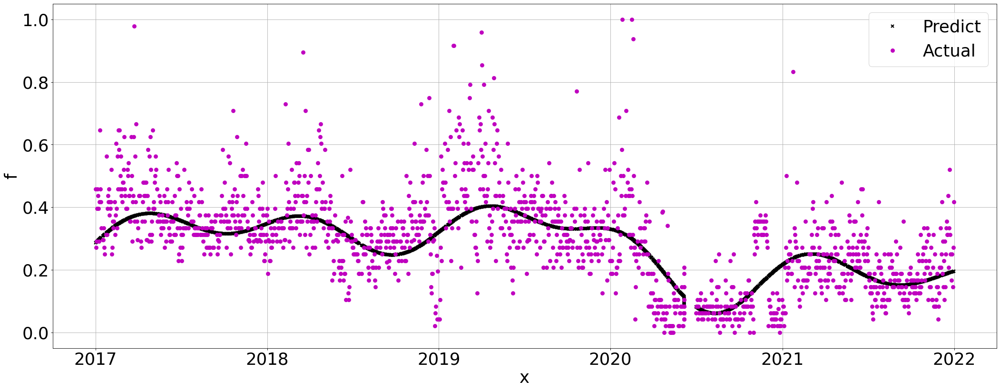

In [148]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [149]:
# Denormalisasi
max = 86.0
min = 4.0
test_Y_denorm = (test_Y.flatten() * (max - min) + min)
prediksi_denorm = (m1.predict(test_X)[0].flatten() * (max - min) + min)
metrics.r2_score(test_Y_denorm, prediksi_denorm)

0.43666030507169207

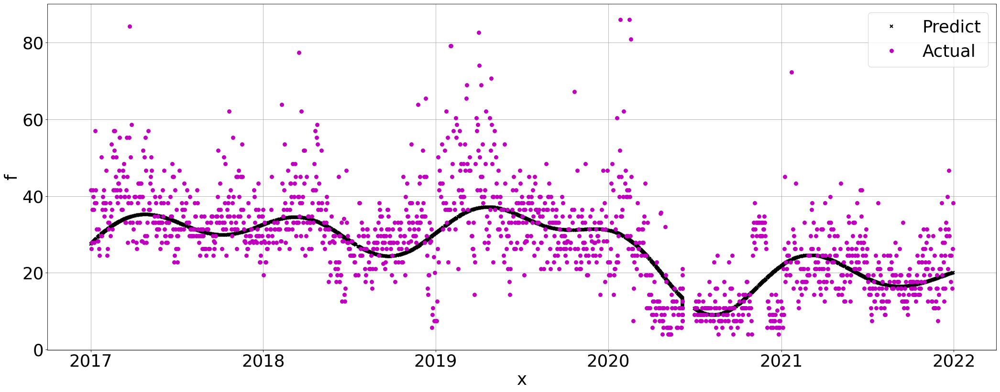

In [150]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), prediksi_denorm, 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y_denorm, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [151]:
data_test = pd.DataFrame(test_Y_denorm, columns=['Data Test'])
prediksi = pd.DataFrame(prediksi_denorm, columns=['Prediksi'])
selisih = abs(test_Y_denorm.flatten() - prediksi_denorm.flatten())
selisih = pd.DataFrame(selisih, columns=['Selisih'])
pd.concat([data_test, prediksi, selisih], axis=1, join='inner')

,Data Test,Prediksi,Selisih
0,34.750000,31.227012,3.522988
1,24.500000,24.557019,0.057019
2,31.333333,30.013976,1.319357
3,36.458333,34.321741,2.136593
4,86.000000,30.042856,55.957144
...,...,...,...
1639,29.625000,26.177047,3.447953
1640,21.083333,30.598405,9.515072
1641,19.375000,11.774389,7.600611
1642,10.833333,23.505350,12.672017


Periodic

In [152]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [153]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [154]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.10074869657386623
MSE: 0.01811132275536082
RMSE: 0.13457831458062186
MAPE: 6369039399546.649
R2 Square 0.24969796019645085
__________________________________


In [155]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.21559402099691283

White

In [156]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [157]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [158]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.2954981163394718
MSE: 0.11145784596600852
RMSE: 0.33385303048798065
MAPE: 0.9939172749391727
R2 Square -3.617390475008402
__________________________________


In [159]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-4.345138660569171

Linear

In [160]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [161]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [162]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.21930079703615066
MSE: 0.06520745506878005
RMSE: 0.2553575044301225
MAPE: 7932352816633.599
R2 Square -1.7013646219750802
__________________________________


In [163]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

-1.7552499764739475

Exponential

In [164]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [165]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [166]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08378047478852446
MSE: 0.014398112631603099
RMSE: 0.11999213570731666
MAPE: 3028628379054.8857
R2 Square 0.40352599184863724
__________________________________


In [167]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.9999999999990357

Matern32

In [168]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [169]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [170]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08203692576794085
MSE: 0.01323250317162589
RMSE: 0.11503261785957011
MAPE: 3832827520082.9854
R2 Square 0.4518139698858211
__________________________________


In [171]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.44394607783050244

Matern52

In [172]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [173]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [174]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08266434814889344
MSE: 0.013398700220698046
RMSE: 0.11575275470025777
MAPE: 3901026601955.18
R2 Square 0.44492888553209775
__________________________________


In [175]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.4294693535697178

Brownian

In [6]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [177]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06747754673257778
MSE: 0.008790980477814056
RMSE: 0.09376022865700603
MAPE: 2201300011869.9346
R2 Square 0.6652904930314654
__________________________________


In [179]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.6308963480906497

Bias

In [180]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [181]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [182]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.119511042905166
MSE: 0.0241521231383077
RMSE: 0.1554095336146007
MAPE: 7994590978565.059
R2 Square -0.0005557021446689347
__________________________________


In [183]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-7.0248868073718995e-06

Periodik Eksponensial

In [184]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [185]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [186]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.3004442025997465
MSE: 0.11943016688757138
RMSE: 0.3455866995235369
MAPE: 1926753532436.8093
R2 Square -3.9476616943011287
__________________________________


In [187]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

-3.9284821977116913